<a href="https://colab.research.google.com/github/aisawanj/Data_Collection_and_Data_Cleansing/blob/main/Project_01_Data_Collection_with_Pandas_and_Data_Cleansing_with_Spark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project_01:  Data Collection with Pandas and Data Cleansing with Spark**

Getting data from the MySQL database, Rest API and Google Drive using PyMySQL and Requests packages by integrating data using Pandas to create a global schema. Subsequently, data cleansing is performed with PySpark, and processed data is upload to a data lake on Google Cloud Storage with gcloud SDK

*Remarks: The Source Code has been referenced database connection and Getting URL from DataTH for testing "project_01" / Cr. DataTH.*

## **Database (confidential)**

Create a variable to save passwords in the env file for use connect to the database  (Using a method to create a .env file `%%writefile .env`)

In [1]:
# Reserved rights to access information.
%%writefile .env
MYSQL_HOST = ''
MYSQL_PORT = ''
MYSQL_USER = ''
MYSQL_PASSWORD = ''
MYSQL_DB = ''
MYSQL_CHARSET = ''

Writing .env


## **1. Data Collection with Pandas**

In [2]:
# Install pymysql for connect to MySQL database
!pip install pymysql

# Install python-dotenv for read variables from .env file
!pip install python-dotenv

# Browse and read variables from .env
import os
from dotenv import load_dotenv
load_dotenv()

class config:
  MYSQL_HOST = os.getenv("MYSQL_HOST")
  MYSQL_PORT = int(os.getenv("MYSQL_PORT"))
  MYSQL_USER = os.getenv("MYSQL_USER")
  MYSQL_PASSWORD = os.getenv("MYSQL_PASSWORD")
  MYSQL_DB = os.getenv("MYSQL_DB")
  MYSQL_CHARSET = os.getenv("MYSQL_CHARSET")

# Connect to the database
import pymysql
connection = pymysql.connect(host = config.MYSQL_HOST,
                             port = config.MYSQL_PORT,
                             user = config.MYSQL_USER,
                             password = config.MYSQL_PASSWORD,
                             db = config.MYSQL_DB,
                             charset = config.MYSQL_CHARSET,
                             cursorclass = pymysql.cursors.DictCursor)

# Connect to Google Drive for import data
from google.colab import drive
drive.mount('/content/drive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 825.4 kB/s eta 0:00:00
Mounted at /content/drive


In [ ]:
# Query data from Database
import pandas as pd
sql = "SELECT * FROM audible_data"
audible_data = pd.read_sql(sql, connection)
audible_data = audible_data.set_index("Book_ID")

# Import data from Google Drive into Colab
path = "/content/drive/MyDrive/My data/audible_transaction.csv"
audible_transaction = pd.read_csv(path)

# Get data from REST API
import requests
url = "https://r2de2-workshop-vmftiryt6q-ts.a.run.app/usd_thb_conversion_rate"
r = requests.get(url)
result_conversion_rate = r.json()

# Create new datafrme is "conversion_rate"
conversion_rate = pd.DataFrame(result_conversion_rate)

# Change the index to the column "date" and save to CSV file "conversion_rate.csv"
conversion_rate = conversion_rate.reset_index().rename(columns={"index":"date"})

In [4]:
# Review dataframe "audible_data"
audible_data.head()

,Book Title,Book Subtitle,Book Author,Book Narrator,Audio Runtime,Audiobook_Type,Categories,Rating,Total No. of Ratings,Price
Book_ID,,,,,,,,,,
1,Bamboozled by Jesus,How God Tricked Me into the Life of My Dreams,Yvonne Orji,Yvonne Orji,6 hrs and 31 mins,Unabridged Audiobook,Biographies & Memoirs,5,47.0,$29.65
2,Sixth Realm Part 1,"A LitRPG Fantasy Series (The Ten Realms, Book 6)",Michael Chatfield,Neil Hellegers,13 hrs and 33 mins,Unabridged Audiobook,Science Fiction & Fantasy,4.5,98.0,$24.95
3,Go Tell the Bees That I Am Gone,"Outlander, Book 9",Diana Gabaldon,Davina Porter,27 hrs and 30 mins,Unabridged Audiobook,Science Fiction & Fantasy,None,NaN,$41.99
4,How the Word Is Passed,A Reckoning with the History of Slavery Across...,Clint Smith,Clint Smith,10 hrs and 7 mins,Unabridged Audiobook,History,None,NaN,$29.65
5,The Devil May Dance,A Novel,Jake Tapper,Rob Shapiro,10 hrs and 12 mins,Unabridged Audiobook,"Mystery, Thriller & Suspense",4.5,108.0,$29.65


In [5]:
# Review dataframe "audible_transaction"
audible_transaction.head()

,timestamp,user_id,book_id,country
0,2021-05-01 00:00:26,av81dw43,1556,Algeria
1,2021-05-01 00:11:27,pu85rp16,220,Algeria
2,2021-05-01 00:13:59,pw57qd54,238,Algeria
3,2021-05-01 00:19:32,vg64hc80,879,Algeria
4,2021-05-01 00:24:43,tu45zu42,1372,Algeria


In [6]:
# Review dataframe "conversion_rate"
conversion_rate.head()

,date,conversion_rate
0,2021-04-01,31.194
1,2021-04-02,31.290
2,2021-04-03,31.256
3,2021-04-04,31.244
4,2021-04-05,31.342


In [7]:
# Create Table "transaction" by merge table "audible_data" & "audible_transaction"
transaction = pd.merge(audible_transaction, audible_data, how="left", left_on="book_id", right_on="Book_ID")

# Convert data type to be date type in both dataframes (transaction, conversion_rate)
transaction["date"] = transaction["timestamp"]
transaction["date"] = pd.to_datetime(transaction["timestamp"]).dt.date
conversion_rate["date"] = pd.to_datetime(conversion_rate["date"]).dt.date

# Create new dataframe "final_df" by merge 2 dataFrame (transaction & conversion_rate)
final_df = pd.merge(transaction, conversion_rate, how="left", left_on="date", right_on="date")

# Edit column "Price" by replacing "$" to "" and converting data type is float
final_df["Price"] = final_df.apply(lambda x: x["Price"].replace("$", ""), axis=1)
final_df["Price"] = final_df["Price"].astype(float)

# Create a new column "THB_Price" with column "Price" multiply "conversion_rate
final_df["THB_Price"] = final_df["Price"]
final_df["THB_Price"] = final_df.apply(lambda x: x["Price"] * x["conversion_rate"], axis=1)

# Rename column "Total No. of Ratings" to "Total_No_of_Ratings"
final_df = final_df.rename(columns={"Total No. of Ratings" : "Total_No_of_Ratings"})

# Drop column "date"
final_df =  final_df.drop("date", axis=1)

# Save to CSV file
final_df.to_csv("transaction_data.csv", index=False)

In [8]:
final_df.shape

(1048575, 16)

In [9]:
final_df.head()

,timestamp,user_id,book_id,country,Book Title,Book Subtitle,Book Author,Book Narrator,Audio Runtime,Audiobook_Type,Categories,Rating,Total_No_of_Ratings,Price,conversion_rate,THB_Price
0,2021-05-01 00:00:26,av81dw43,1556,Algeria,Arcanum Unbounded: The Cosmere Collection,None,Brandon Sanderson,Michael Kramer,22 hrs and 31 mins,Unabridged Audiobook,Literature & Fiction,4.8,14108.0,48.99,31.14,1525.5486
1,2021-05-01 00:11:27,pu85rp16,220,Algeria,The Name of the Wind,"Kingkiller Chronicle, Book 1",Patrick Rothfuss,Nick Podehl,27 hrs and 55 mins,Unabridged Audiobook,Literature & Fiction,4.7,90897.0,29.99,31.14,933.8886
2,2021-05-01 00:13:59,pw57qd54,238,Algeria,Shoe Dog,A Memoir by the Creator of Nike,Phil Knight,Norbert Leo Butz,13 hrs and 21 mins,Unabridged Audiobook,Biographies & Memoirs,4.9,42885.0,27.99,31.14,871.6086
3,2021-05-01 00:19:32,vg64hc80,879,Algeria,We Were Liars,None,E. Lockhart,Ariadne Meyers,6 hrs and 27 mins,Unabridged Audiobook,Teen,4,4759.0,25.20,31.14,784.7280
4,2021-05-01 00:24:43,tu45zu42,1372,Algeria,The Last Wish,None,Andrzej Sapkowski,Peter Kenny,10 hrs and 17 mins,Unabridged Audiobook,Science Fiction & Fantasy,4.7,34499.0,25.08,31.14,780.9912


## **2. Data Cleansing with Spark**

### 2.1) Install Spark and Pyspark

In [ ]:
!apt-get update                                                                           # Update the total Package in VM
!apt-get install openjdk-8-jdk-headless -qq > /dev/null                                   # Install Java Development Kit (necessary for install Spark)
!wget -q https://archive.apache.org/dist/spark/spark-3.1.2/spark-3.1.2-bin-hadoop2.7.tgz  # Install Spark 3.1.2
!tar xzvf spark-3.1.2-bin-hadoop2.7.tgz                                                   # Unzip file Spark 3.1.2
!pip install -q findspark==1.3.0                                                          # Install Package Python for connect Spark

# Set environment variable for Python to get to know spark
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.1.2-bin-hadoop2.7"

# Install PySpark into Python
!pip install pyspark==3.1.2

# Create Spark Session for Spark
from pyspark.sql import SparkSession
spark = SparkSession.builder.master("local[*]").getOrCreate()

### 2.2) Data Profiling

In [11]:
# Read csv file
dt = spark.read.csv('/content/transaction_data.csv', header = True, inferSchema = True)

In [12]:
# Check the data overview
print(f"Rows: {dt.count()}, Columns: {len(dt.columns)}\n")
dt.show(10, False)
dt.printSchema()
dt.summary("count").show()
dt.summary().show()

Rows: 1048575, Columns: 16

+-------------------+--------+-------+-------+-------------------------------------------------+------------------------------------------------------------+-----------------+----------------+------------------+--------------------+-----------------------------------------------+------+-------------------+-----+---------------+------------------+
|timestamp          |user_id |book_id|country|Book Title                                       |Book Subtitle                                               |Book Author      |Book Narrator   |Audio Runtime     |Audiobook_Type      |Categories                                     |Rating|Total_No_of_Ratings|Price|conversion_rate|THB_Price         |
+-------------------+--------+-------+-------+-------------------------------------------------+------------------------------------------------------------+-----------------+----------------+------------------+--------------------+------------------------------------------

### 2.3) EDA : Exploratory Data Analysis

Graphical EDA

<Axes: xlabel='Price', ylabel='Count'>

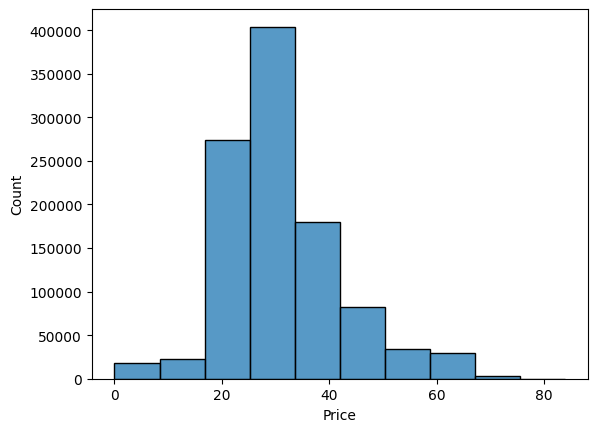

In [13]:
# Convert Spark dataframe to Pandas dataframe
import pandas as pd
dt_pd = dt.toPandas()

# Data visualization with package "seaborn"
import seaborn as sns
sns.histplot(dt_pd["Price"], bins=10)

In [14]:
# Data visualization with plotly (Interactive Chart)
import plotly.express as px
fig = px.scatter(dt_pd, "book_id", "Price")
fig.show()

### 2.4) Convert data type

In [15]:
# Convert column "timestamp" from string to timestamp data type
from pyspark.sql import functions as f
dt_clean = dt.withColumn("timestamp", f.to_timestamp(dt["timestamp"], "yyyy-MM-dd HH:mm:ss"))

In [16]:
dt_clean.printSchema()

root
 |-- timestamp: timestamp (nullable = true)
 |-- user_id: string (nullable = true)
 |-- book_id: integer (nullable = true)
 |-- country: string (nullable = true)
 |-- Book Title: string (nullable = true)
 |-- Book Subtitle: string (nullable = true)
 |-- Book Author: string (nullable = true)
 |-- Book Narrator: string (nullable = true)
 |-- Audio Runtime: string (nullable = true)
 |-- Audiobook_Type: string (nullable = true)
 |-- Categories: string (nullable = true)
 |-- Rating: string (nullable = true)
 |-- Total_No_of_Ratings: double (nullable = true)
 |-- Price: double (nullable = true)
 |-- conversion_rate: double (nullable = true)
 |-- THB_Price: double (nullable = true)



### 2.5) Data Anomaly

(2.5.1) Syntactical Anomalies

In [17]:
# Check column "country"
country_count = dt_clean.select(dt_clean["country"]).distinct().sort("country").count()
print(f"country count = {country_count}\n")
dt_clean.select(dt_clean["country"]).distinct().sort("country").show(59, False)

country count = 59

+------------------------+
|country                 |
+------------------------+
|Algeria                 |
|Argentina               |
|Australia               |
|Austria                 |
|Bahamas                 |
|Belgium                 |
|Brazil                  |
|Canada                  |
|China                   |
|Colombia                |
|Croatia                 |
|Denmark                 |
|Dubai                   |
|Egypt                   |
|Estonia                 |
|Finland                 |
|France                  |
|Germany                 |
|Greece                  |
|Hungary                 |
|India                   |
|Indonesia               |
|Ireland                 |
|Israel                  |
|Italy                   |
|Jamaica                 |
|Japan                   |
|Japane                  |
|Kenya                   |
|Kuwait                  |
|Malaysia                |
|Maldives                |
|Mexico                  |
|Montene

In [18]:
# Cleansing column "country" by replacing "Japane" to "Japan"
from pyspark.sql.functions import when
dt_clean_country = dt_clean.withColumn("country_update", when(dt_clean["country"] == "Japane", "Japan").otherwise(dt_clean["country"]))
dt_clean = dt_clean_country.drop("country").withColumnRenamed("country_update", "Country")

# Cleansing column "country" by replacing "Philippine" to "Philippines"
dt_clean_Country = dt_clean.withColumn("Country_update", when(dt_clean["Country"] == "Philippine", "Philippines").otherwise(dt_clean["Country"]))
dt_clean = dt_clean_Country.drop("Country").withColumnRenamed("Country_update", "Country")

In [19]:
# Review after editing column "Country"
Country_count = dt_clean.select(dt_clean["Country"]).distinct().sort("Country").count()
print(f"Country count = {Country_count}\n")
dt_clean.select(dt_clean["Country"]).distinct().sort("Country").show(57, False)

Country count = 57

+------------------------+
|Country                 |
+------------------------+
|Algeria                 |
|Argentina               |
|Australia               |
|Austria                 |
|Bahamas                 |
|Belgium                 |
|Brazil                  |
|Canada                  |
|China                   |
|Colombia                |
|Croatia                 |
|Denmark                 |
|Dubai                   |
|Egypt                   |
|Estonia                 |
|Finland                 |
|France                  |
|Germany                 |
|Greece                  |
|Hungary                 |
|India                   |
|Indonesia               |
|Ireland                 |
|Israel                  |
|Italy                   |
|Jamaica                 |
|Japan                   |
|Kenya                   |
|Kuwait                  |
|Malaysia                |
|Maldives                |
|Mexico                  |
|Montenegro              |
|Netherl

(2.5.2) Semantic Anomalies

In [20]:
# Check & Edit column "user_id"
dt_clean_correct_user_id_count = dt_clean.where(dt_clean["user_id"].rlike("^[a-z0-9]{8}$")).count()
print(f"Correct_user_id_counts: {dt_clean_correct_user_id_count}")

dt_correct_userid = dt_clean.where(dt_clean["user_id"].rlike("^[a-z0-9]{8}$"))
dt_incorrect_userid = dt_clean.subtract(dt_correct_userid)

# Review dataframe "dt_incorrect_userid"
dt_clean_incorrect_user_id_count = dt_incorrect_userid.count()
print(f"Incorrect_user_id_counts: {dt_clean_incorrect_user_id_count}\n")
dt_incorrect_userid.select("user_id").show()

Correct_user_id_counts: 1048568
Incorrect_user_id_counts: 7

+----------+
|   user_id|
+----------+
|      null|
|bj03at4600|
|fx80th7100|
|      null|
|      null|
|      null|
|      null|
+----------+



In [21]:
dt_clean_userid = dt_clean.withColumn("user_id_update", when(dt_clean["user_id"] == "bj03at4600", "bj03at46").otherwise(dt_clean["user_id"]))
dt_clean = dt_clean_userid.drop("user_id").withColumnRenamed("user_id_update", "User_ID")

dt_clean_UserID = dt_clean.withColumn("User_id_update", when(dt_clean["User_ID"] == "fx80th7100", "fx80th71").otherwise(dt_clean["User_ID"]))
dt_clean = dt_clean_UserID.drop("User_ID").withColumnRenamed("User_id_update", "User_ID")

In [22]:
# Recheck column "User_ID" after editing
dt_clean_correct_User_ID = dt_clean.where(dt_clean["User_ID"].rlike("^[a-z0-9]{8}$"))
dt_clean_incorrect_User_ID = dt_clean.subtract(dt_clean_correct_User_ID)

# Review dataframe "dt_clean_incorrect_User_ID"
dt_clean_User_ID_count = dt_clean.where(dt_clean["User_ID"].rlike("^[a-z0-9]{8}$")).count()
print(f"User_ID_counts: {dt_clean_User_ID_count}\n")

# Show incorrect dataframe for rechecking column "User_ID" after editing
dt_clean_incorrect_User_ID.select("User_ID").show()

User_ID_counts: 1048570

+-------+
|User_ID|
+-------+
|   null|
|   null|
|   null|
|   null|
|   null|
+-------+



(2.5.3) Coverage Anomalies (Missing Value)

In [23]:
# Check missing Value
dt_clean.summary("count").show()

# Check dataframe "dt_clean" is Null value
from pyspark.sql.functions import col, sum
dt_null_list = dt_clean.select([sum(col(colname).isNull().cast("int")).alias(colname) for colname in dt_clean.columns])
dt_null_list.show()

dt_clean.show(10, False)

+-------+-------+----------+-------------+-----------+-------------+-------------+--------------+----------+-------+-------------------+-------+---------------+---------+-------+-------+
|summary|book_id|Book Title|Book Subtitle|Book Author|Book Narrator|Audio Runtime|Audiobook_Type|Categories| Rating|Total_No_of_Ratings|  Price|conversion_rate|THB_Price|Country|User_ID|
+-------+-------+----------+-------------+-----------+-------------+-------------+--------------+----------+-------+-------------------+-------+---------------+---------+-------+-------+
|  count|1048575|   1048575|       642122|    1048575|      1046684|      1048575|       1046462|   1036835|1040878|            1038987|1048575|        1048575|  1048575|1048575|1048570|
+-------+-------+----------+-------------+-----------+-------------+-------------+--------------+----------+-------+-------------------+-------+---------------+---------+-------+-------+

+---------+-------+----------+-------------+-----------+--------

In [24]:
# Remarks : TBA (To Be Announced)
# Replacing "TBA" value in Columns: "Book Subtitle", "Book Narrator", "Audiobook_Type", "Categories", "Rating" and "Total_No_of_Ratings"

dt_clean_Book_Subtitle = dt_clean.withColumn("Book_Subtitle_update", when(dt_clean["Book Subtitle"].isNull(), "TBA").otherwise(dt_clean["Book Subtitle"]))
dt_clean = dt_clean_Book_Subtitle.drop("Book Subtitle").withColumnRenamed("Book_Subtitle_update", "Book_Subtitle")

dt_clean_Book_Narrator = dt_clean.withColumn("Book_Narrator_update", when(dt_clean["Book Narrator"].isNull(), "TBA").otherwise(dt_clean["Book Narrator"]))
dt_clean = dt_clean_Book_Narrator.drop("Book Narrator").withColumnRenamed("Book_Narrator_update", "Book_Narrator")

dt_clean_Audiobook_Type = dt_clean.withColumn("Audiobook_Type_update", when(dt_clean["Audiobook_Type"].isNull(), "TBA").otherwise(dt_clean["Audiobook_Type"]))
dt_clean = dt_clean_Audiobook_Type.drop("Audiobook_Type").withColumnRenamed("Audiobook_Type_update", "Audiobook_Type")

dt_clean_Categories = dt_clean.withColumn("Categories_update", when(dt_clean["Categories"].isNull(), "TBA").otherwise(dt_clean["Categories"]))
dt_clean = dt_clean_Categories.drop("Categories").withColumnRenamed("Categories_update", "Categories")

# Replacing "0.0" value in Columns: "Rating" and "Total_No_of_Ratings"
dt_clean_Rating = dt_clean.withColumn("Rating_update", when(dt_clean["Rating"].isNull(), "0.0").otherwise(dt_clean["Rating"]))
dt_clean = dt_clean_Rating.drop("Rating").withColumnRenamed("Rating_update", "Rating")

dt_clean_Total_No_of_Ratings = dt_clean.withColumn("Total_No_of_Ratings_update", when(dt_clean["Total_No_of_Ratings"].isNull(), "0.0").otherwise(dt_clean["Total_No_of_Ratings"]))
dt_clean = dt_clean_Total_No_of_Ratings.drop("Total_No_of_Ratings").withColumnRenamed("Total_No_of_Ratings_update", "Total_No_of_Ratings")

# Replacing "00000000" value in Column: "User_ID"
dt_clean_User_ID = dt_clean.withColumn("User_ID_update", when(dt_clean["User_ID"].isNull(), "00000000").otherwise(dt_clean["User_ID"]))
dt_clean = dt_clean_User_ID.drop("User_ID").withColumnRenamed("User_ID_update", "User_id")

In [25]:
# Review dataframe "dt_clean" after cleansing "Null" value
dt_clean.summary("count").show()

from pyspark.sql.functions import col, sum
dt_null_list = dt_clean.select([sum(col(colname).isNull().cast("int")).alias(colname) for colname in dt_clean.columns])
dt_null_list.show()

dt_clean.show(10, False)

+-------+-------+----------+-----------+-------------+-------+---------------+---------+-------+-------------+-------------+--------------+----------+-------+-------------------+-------+
|summary|book_id|Book Title|Book Author|Audio Runtime|  Price|conversion_rate|THB_Price|Country|Book_Subtitle|Book_Narrator|Audiobook_Type|Categories| Rating|Total_No_of_Ratings|User_id|
+-------+-------+----------+-----------+-------------+-------+---------------+---------+-------+-------------+-------------+--------------+----------+-------+-------------------+-------+
|  count|1048575|   1048575|    1048575|      1048575|1048575|        1048575|  1048575|1048575|      1048575|      1048575|       1048575|   1048575|1048575|            1048575|1048575|
+-------+-------+----------+-----------+-------------+-------+---------------+---------+-------+-------------+-------------+--------------+----------+-------+-------------------+-------+

+---------+-------+----------+-----------+-------------+-----+--

## **3. Save data to CSV**

In [26]:
# Save to csv as a single file
dt_clean.coalesce(1).write.csv("Cleaned_data.csv", header=True)